In [2]:
pip install cufflinks

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for cufflinks: filename=cufflinks-0.17.3-py3-none-any.whl size=68727 sha256=9dc780caa70ee86e200dddc85e4b31f7028c03b2e4296dd2d345a22f92bc32a0
  Stored in directory: c:\users\shashank\appdata\local\pip\cache\wheels\c3\bf\8f\afa0730b29e347e8c1071049f89748c1262e7a14a838820ae6
Successfully built cufflinks
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0.1 -> 25.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
import cufflinks as cf
import plotly.io as pio

import os

In [18]:
print(os.getcwd())

c:\Users\SHASHANK\OneDrive\Desktop\Evelate labs\indian_army_eda\notebooks


In [4]:
cf.go_offline()
pio.renderers.default = 'notebook'

In [ ]:
data_path = '../Data/cleaned_globalterrorism.csv'
df = pd.read_csv(data_path)


df.head()


C:\Users\SHASHANK\AppData\Local\Temp\ipykernel_6708\2489049055.py:6: DtypeWarning:

Columns (3,5,27,29,57,58,59,72,75,86,88,90,92,110,111,117) have mixed types. Specify dtype option on import or set low_memory=False.



,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,region_txt,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,Central America & Caribbean,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,1970,0,0,NaN,0,NaN,130,Mexico,1,North America,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,1970,1,0,NaN,0,NaN,160,Philippines,5,Southeast Asia,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,1970,1,0,NaN,0,NaN,78,Greece,8,Western Europe,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,1970,1,0,NaN,0,NaN,101,Japan,4,East Asia,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


In [7]:
df.info()
df.describe()
df.isnull().sum()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Columns: 131 entries, iyear to related
dtypes: float64(54), int64(21), object(56)
memory usage: 181.6+ MB


iyear              0
imonth             0
iday               0
approxdate    172452
extended           0
               ...  
INT_LOG            0
INT_IDEO           0
INT_MISC           0
INT_ANY            0
related       156653
Length: 131, dtype: int64

In [8]:
fig = px.pie(df, names='attacktype1_txt', title='Distribution of Attack Types')
fig.write_html('../output/attack_type_distribution.html')
fig.show()


In [ ]:
attacks_per_year = df['iyear'].value_counts().sort_index()


fig = px.line(x=attacks_per_year.index, 
              y=attacks_per_year.values, 
              title='Number of Terrorist Attacks Each Year', 
              markers=True,
              labels={'x': 'Year', 'y': 'Number of Attacks'})


fig.write_html('../output/yearly_attacks.html')


fig.show()


In [11]:
top_countries = df['country_txt'].value_counts().nlargest(10)
fig = px.bar(x=top_countries.index, y=top_countries.values, title='Top 10 Countries with Most Attacks', labels={'x':'Country', 'y':'Number of Attacks'})
fig.write_html('../output/top_countries.html')
fig.show()


In [12]:
heatmap_data = pd.crosstab(df['country_txt'], df['attacktype1_txt'])
fig = px.imshow(heatmap_data, title='Heatmap: Country vs Attack Type')
fig.write_html('../output/country_attack_heatmap.html')
fig.show()


In [16]:
pip install kaleido


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0.1 -> 25.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [25]:
print(df.describe())
print(df.info())
print(df['attacktype1_txt'].value_counts())


               iyear         imonth           iday       extended  \
count  181691.000000  181691.000000  181691.000000  181691.000000   
mean     2002.638997       6.467277      15.505644       0.045346   
std        13.259430       3.388303       8.814045       0.208063   
min      1970.000000       0.000000       0.000000       0.000000   
25%      1991.000000       4.000000       8.000000       0.000000   
50%      2009.000000       6.000000      15.000000       0.000000   
75%      2014.000000       9.000000      23.000000       0.000000   
max      2017.000000      12.000000      31.000000       1.000000   

             country         region       latitude     longitude  \
count  181691.000000  181691.000000  177135.000000  1.771340e+05   
mean      131.968501       7.160938      23.498343 -4.586957e+02   
std       112.414535       2.933408      18.569242  2.047790e+05   
min         4.000000       1.000000     -53.154613 -8.618590e+07   
25%        78.000000       5.000000   

In [ ]:
fig_nkill = px.histogram(
    df,
    x='nkill',
    nbins=30,
    title='Distribution of Number of Kills',
    labels={'nkill': 'Number of Kills'},
    marginal='box',       
    opacity=0.75           
)


fig_nkill.update_layout(
    template='plotly_white', 
    title={'x':0.5, 'xanchor':'center'},   
    xaxis=dict(tickmode='linear')          
)

fig.write_html('../output/distribution of number of kills.html')


fig_nkill.show()


In [ ]:
data_path = '../Data/cleaned_globalterrorism.csv'
df = pd.read_csv(data_path)


print(df.isnull().sum())


df = df.dropna()


print(df.info())

C:\Users\SHASHANK\AppData\Local\Temp\ipykernel_6708\2926496265.py:2: DtypeWarning:

Columns (3,5,27,29,57,58,59,72,75,86,88,90,92,110,111,117) have mixed types. Specify dtype option on import or set low_memory=False.



iyear              0
imonth             0
iday               0
approxdate    172452
extended           0
               ...  
INT_LOG            0
INT_IDEO           0
INT_MISC           0
INT_ANY            0
related       156653
Length: 131, dtype: int64
<class 'pandas.core.frame.DataFrame'>
Index: 0 entries
Columns: 131 entries, iyear to related
dtypes: float64(54), int64(21), object(56)
memory usage: 0.0+ bytes
None


In [ ]:
print(df.describe())


print(df['attacktype1_txt'].value_counts())


print(df.head())


       iyear  imonth  iday  extended  country  region  latitude  longitude  \
count    0.0     0.0   0.0       0.0      0.0     0.0       0.0        0.0   
mean     NaN     NaN   NaN       NaN      NaN     NaN       NaN        NaN   
std      NaN     NaN   NaN       NaN      NaN     NaN       NaN        NaN   
min      NaN     NaN   NaN       NaN      NaN     NaN       NaN        NaN   
25%      NaN     NaN   NaN       NaN      NaN     NaN       NaN        NaN   
50%      NaN     NaN   NaN       NaN      NaN     NaN       NaN        NaN   
75%      NaN     NaN   NaN       NaN      NaN     NaN       NaN        NaN   
max      NaN     NaN   NaN       NaN      NaN     NaN       NaN        NaN   

       specificity  vicinity  ...  ransomamt  ransomamtus  ransompaid  \
count          0.0       0.0  ...        0.0          0.0         0.0   
mean           NaN       NaN  ...        NaN          NaN         NaN   
std            NaN       NaN  ...        NaN          NaN         NaN   
min  

In [ ]:
print("Data Shape:", df.shape)  
print("Column Names:", df.columns)  

print("Distribution of Attack Types:\n", df['attacktype1_txt'].value_counts())


print("Correlation Matrix:\n", df.corr())


Data Shape: (0, 131)
Column Names: Index(['iyear', 'imonth', 'iday', 'approxdate', 'extended', 'resolution',
       'country', 'country_txt', 'region', 'region_txt',
       ...
       'addnotes', 'scite1', 'scite2', 'scite3', 'dbsource', 'INT_LOG',
       'INT_IDEO', 'INT_MISC', 'INT_ANY', 'related'],
      dtype='object', length=131)
Distribution of Attack Types:
 Series([], Name: count, dtype: int64)
Correlation Matrix:
             iyear  imonth  iday  approxdate  extended  resolution  country  \
iyear         NaN     NaN   NaN         NaN       NaN         NaN      NaN   
imonth        NaN     NaN   NaN         NaN       NaN         NaN      NaN   
iday          NaN     NaN   NaN         NaN       NaN         NaN      NaN   
approxdate    NaN     NaN   NaN         NaN       NaN         NaN      NaN   
extended      NaN     NaN   NaN         NaN       NaN         NaN      NaN   
...           ...     ...   ...         ...       ...         ...      ...   
INT_LOG       NaN     NaN  

c:\python\Lib\site-packages\seaborn\matrix.py:202: RuntimeWarning:

All-NaN slice encountered

c:\python\Lib\site-packages\seaborn\matrix.py:207: RuntimeWarning:

All-NaN slice encountered



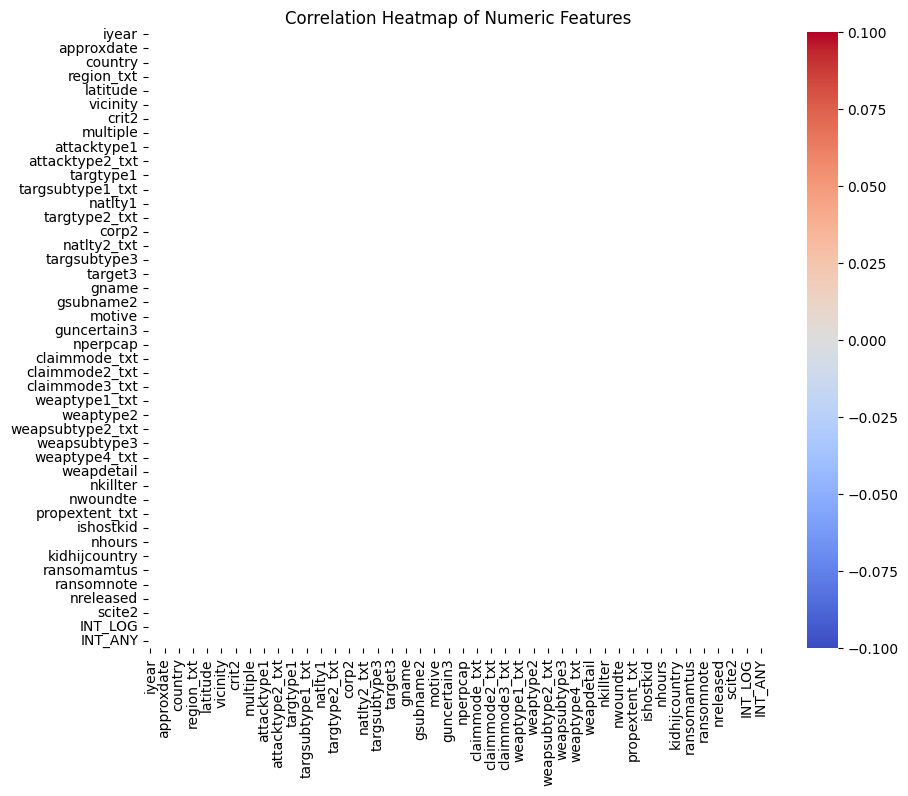

In [ ]:



corr_matrix = df.corr()


plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap of Numeric Features')
fig.write_html('../output/correlation_heatmap.html')
plt.savefig('../output/correlation_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()


In [51]:
pip install nbconvert



[notice] A new release of pip is available: 25.0.1 -> 25.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [52]:
jupyter nbconvert --to html EDA_INDIAN_ARMY.ipynb


SyntaxError: invalid syntax (3810460278.py, line 1)